In [ ]:
!pip install TTS
!pip install numpy scipy
!pip install git+https://github.com/openai/whisper.git
!pip install indic-transliteration
!pip install jiwer
!pip install googletrans==4.0.0-rc1
!pip install tensorflow==2.12.0
!pip install pickle-mixin
!pip install openai-whisper
!pip install librosa matplotlib
!pip install nltk
!pip install batch-face

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.5/73.5 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 70.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 7.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.3/15.3 MB 23.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.1/18.1 MB 18.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.4/31.4 MB 12.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 108.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 938.0/938.0 kB 50.0 M

  Preparing metadata (setup.py) ... done
  Created wheel for pickle-mixin: filename=pickle_mixin-1.0.2-py3-none-any.whl size=5990 sha256=662ba71aeea98ce24c0e4d5dd5a0d3b012384645067555b9c76621505c2ee422
  Stored in directory: /root/.cache/pip/wheels/d0/9c/0d/8709be17c02b72bf04ea60d8ec64fc46a1554c0fb81e048dd6
Successfully built pickle-mixin
^C
^C
^C
^C


Uploading Video

In [ ]:
from google.colab import files
import os
import subprocess

uploaded = None
resize_to_720p = False

def upload_video():
  global uploaded
  global video_path
  uploaded = files.upload()
  for filename in uploaded.keys():
    print(f'Uploaded {filename}')
    if resize_to_720p:
        filename = resize_video(filename)
    video_path = filename
    return filename


def resize_video(filename):
    output_filename = f"resized_{filename}"
    cmd = f"ffmpeg -i {filename} -vf scale=-1:720 {output_filename}"
    subprocess.run(cmd, shell=True)
    print(f'Resized video saved as {output_filename}')
    return output_filename

import ipywidgets as widgets
from IPython.display import display

button = widgets.Button(description="Upload Video")
checkbox = widgets.Checkbox(value=False, description='Resize to 720p (better results)')
output = widgets.Output()

def on_button_clicked(b):
  with output:
    global video_path
    global resize_to_720p
    resize_to_720p = checkbox.value
    video_path = upload_video()

button.on_click(on_button_clicked)
display(checkbox, button, output)

Checkbox(value=False, description='Resize to 720p (better results)')

Button(description='Upload Video', style=ButtonStyle())

Output()

Extracting Audio Text From Video

In [ ]:
!pip uninstall -y numpy
!pip install numpy==1.24.0


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 99.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.24.0 which is incompatible.
tts 0.22.0 requires numpy>=1.24.3; python_version > "3.10", but you have numpy 1.24.0 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 1.5.3 which is incompatible.
imbalanced-learn 0.13.0 requires numpy<3,>=1.24.3, but you have numpy 1.24.0 which is incompatible.
dask-cudf-cu12 24.12.0 requires pandas<2.2.4dev0,>=2.0, but you have pandas 1.5.3 which is incompatible.
pymc 5.20.1 requires numpy>=1.25.0, but you have numpy 1.24.0 which is incompatible.
cudf-cu12 24.12.0 requires pandas<2.2.4dev0,>=2.0, but you have pandas 1.5.3 which is incompatible.
seaborn 0.13.2 requires numpy!=1.24.0,>=1.20, but you have n

/usr/local/lib/python3.11/dist-packages/whisper/__init__.py:150: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(fp, map_location=device)


Audio text:  Language models. Large language models or LOMs are a very exciting technology, but despite all the buzz and hype, one of the things that still un...
Detected language: en


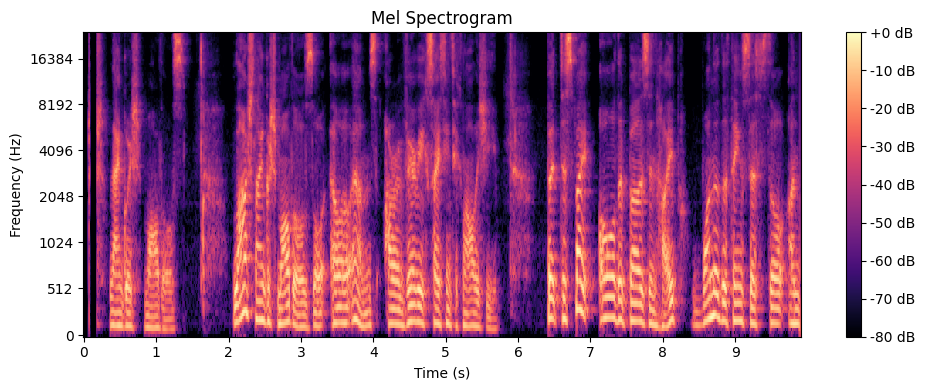

In [ ]:
import subprocess
import whisper
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np


if 'video_path' in globals() and video_path is not None:
    ffmpeg_command = f"ffmpeg -i '{video_path}' -acodec pcm_s24le -ar 48000 -q:a 0 -map a -y 'output_audio.wav'"
    subprocess.run(ffmpeg_command, shell=True)
else:
    print("No video uploaded. Please upload a video first.")

# Load Whisper model
model = whisper.load_model("base")

result = model.transcribe("output_audio.wav")

# Extract transcribed text and language
whisper_text = result["text"]
whisper_language = result['language']

print("Audio text:", whisper_text)
print("Detected language:", whisper_language)

# Generate and visualize the spectrogram
def plot_spectrogram(audio_path):
    y, sr = librosa.load(audio_path, sr=48000)

    # Generate the spectrogram
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
    S_dB = librosa.power_to_db(S, ref=np.max)

    # Plot the spectrogram
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(S_dB, sr=sr, x_axis='time', y_axis='mel', cmap='magma')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    plt.tight_layout()
    plt.show()

# Call the spectrogram plotting function
plot_spectrogram("output_audio.wav")


In [ ]:
import jiwer


transcribed_text = "In today's interconnected and globalized world, the ability to communicate effectively across language barrier has become more important than ever. Business educational institutions."
reference_text = "today's interconnected and globalized world that ability to comminicate effectively across language barrier has become more important than ever. Business educational institutions."

# Calculate WER
wer_score = jiwer.wer(reference_text, transcribed_text)
print(f"WER Score: {wer_score}")


WER Score: 0.18181818181818182


Load the Model and Tokenizers (text-to-text)

In [ ]:
# import tensorflow as tf
# from tensorflow.keras.preprocessing.sequence import pad_sequences
# import numpy as np
# import pickle


# model_path = "/content/drive/MyDrive/VoiceOverAi/eng-to-hindi.h5"
# translation_model = tf.keras.models.load_model(model_path)


# with open("/content/drive/MyDrive/VoiceOverAi/eng_tokenizer.pkl", "rb") as f:
#     eng_tokenizer = pickle.load(f)

# with open("/content/drive/MyDrive/VoiceOverAi/hin_tokenizer.pkl", "rb") as f:
#     hin_tokenizer = pickle.load(f)

# max_eng_seq_len = 20
# max_hin_seq_len = 20


Function to Translate Text

In [ ]:
# def translate_text(input_text):
#     # Tokenize and pad the input sequence
#     input_seq = eng_tokenizer.texts_to_sequences([input_text])
#     input_seq = pad_sequences(input_seq, maxlen=max_eng_seq_len, padding="post")

#     # Predict Hindi token sequence
#     predicted_seq = translation_model.predict(input_seq, verbose=0)
#     predicted_tokens = np.argmax(predicted_seq, axis=-1)

#     # Decode Hindi token sequence back to text
#     translated_words = [hin_tokenizer.index_word.get(token, "") for token in predicted_tokens[0]]
#     translated_text = " ".join([word for word in translated_words if word != ""])
#     return translated_text


Integrating with Whisper Transcription

In [ ]:
# # Transcription result from Whisper
# whisper_text = "This is a test sentence."

# # Translate the Whisper transcription using the loaded model
# translated_text = translate_text(whisper_text)
# print("Translated text:", translated_text)


In [ ]:
target_language_code = 'hi'
from googletrans import Translator
translator = Translator()
translated_text = translator.translate(whisper_text, src=whisper_language, dest=target_language_code).text
print("Translated text:", translated_text)

Translated text: भाषा मॉडल।बड़ी भाषा मॉडल या LOMS एक बहुत ही रोमांचक तकनीक है, लेकिन सभी चर्चा और प्रचार के बावजूद, उन चीजों में से एक है जो अभी भी संयुक्त राष्ट्र ...


In [ ]:
# pip install numpy==1.21.0 scipy==1.7.1


In [ ]:
# import nltk


In [ ]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction


hypothesis = ["आज", "की", "परस्पर", "और", "वैश्विक", "दुनिया", "में", "भाषा", "अवरोध", "में", "प्रभावी", "ढंग", "से", "संवाद", "करने", "की", "क्षमता", "पहले", "से", "कहीं", "अधिक", "महत्वपूर्ण", "हो", "गई", "है", "व्यापार", "शैक्षणिक", "संस्थान"]
reference = [["आज", "की", "परस्पर", "जुड़ी", "और", "वैश्वीकृत", "दुनिया", "में", "भाषाई", "बाधाओं", "के", "पार", "प्रभावी", "ढंग", "से", "संवाद", "करने", "की", "क्षमता", "पहले", "से", "कहीं", "अधिक", "महत्वपूर्ण", "हो", "गई", "है", "व्यावसायिक", "शिक्षण", "संस्थान"]]


smooth_fn = SmoothingFunction().method1

# Calculate BLEU score with smoothing
bleu_score = sentence_bleu(reference, hypothesis, smoothing_function=smooth_fn)
print(f"BLEU Score: {bleu_score}")


BLEU Score: 0.5567566314070299


Voice Synthesis

In [ ]:
from TTS.api import TTS
import torch
from IPython.display import Audio, display
import librosa
import librosa.display
import matplotlib.pyplot as plt

tts = TTS("tts_models/multilingual/multi-dataset/xtts_v2", gpu=True).to("cuda")

#generate audio
tts.tts_to_file(translated_text,
    speaker_wav='output_audio.wav',
    file_path="output_synth.wav",
    language=target_language_code
)
audio_widget = Audio(filename="output_synth.wav", autoplay=False)
display(audio_widget)



/usr/local/lib/python3.11/dist-packages/TTS/api.py:70: UserWarning: `gpu` will be deprecated. Please use `tts.to(device)` instead.
  warnings.warn("`gpu` will be deprecated. Please use `tts.to(device)` instead.")


 > You must confirm the following:
 | > "I have purchased a commercial license from Coqui: licensing@coqui.ai"
 | > "Otherwise, I agree to the terms of the non-commercial CPML: https://coqui.ai/cpml" - [y/n]
 | | > y
 > Downloading model to /root/.local/share/tts/tts_models--multilingual--multi-dataset--xtts_v2


100%|█████████▉| 1.86G/1.87G [00:27<00:00, 84.7MiB/s]
100%|██████████| 1.87G/1.87G [00:27<00:00, 68.0MiB/s]
100%|██████████| 4.37k/4.37k [00:00<00:00, 28.5kiB/s]
 55%|█████▍    | 198k/361k [00:00<00:00, 1.25MiB/s]
100%|██████████| 361k/361k [00:00<00:00, 1.13MiB/s]
100%|██████████| 32.0/32.0 [00:00<00:00, 169iB/s]
 45%|████▍     | 3.46M/7.75M [00:00<00:00, 34.6MiB/s]

 > Model's license - CPML
 > Check https://coqui.ai/cpml.txt for more info.


100%|██████████| 7.75M/7.75M [00:16<00:00, 34.6MiB/s]

 > Using model: xtts


/usr/local/lib/python3.11/dist-packages/TTS/tts/layers/xtts/xtts_manager.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.speakers = torch.load(speaker_file_path)
/u

 > Text splitted to sentences.
['भाषा मॉडल।बड़ी भाषा मॉडल या LOMS एक बहुत ही रोमांचक तकनीक है, लेकिन सभी चर्चा और प्रचार के बावजूद, उन चीजों में से एक है जो अभी भी संयुक्त राष्ट्र ...']


The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


 > Processing time: 8.411855936050415
 > Real-time factor: 0.5842744298104671


In [ ]:
import torch

try:
    del tts
except NameError:
    print("Voice model already deleted")

try:
    del model
except NameError:
    print("Whisper model already deleted")

torch.cuda.empty_cache()

Lip Syncing

In [ ]:
# Dependencies
%cd /content/

import locale
locale.getpreferredencoding = lambda: "UTF-8"

!git clone https://github.com/justinjohn0306/Wav2Lip
!cd Wav2Lip && pip install -r requirements_colab.txt

%cd /content/Wav2Lip

!wget "https://www.adrianbulat.com/downloads/python-fan/s3fd-619a316812.pth" -O "face_detection/detection/sfd/s3fd.pth"
!wget 'https://github.com/justinjohn0306/Wav2Lip/releases/download/models/wav2lip.pth' -O 'checkpoints/wav2lip.pth'
!wget 'https://github.com/justinjohn0306/Wav2Lip/releases/download/models/wav2lip_gan.pth' -O 'checkpoints/wav2lip_gan.pth'
!wget 'https://github.com/justinjohn0306/Wav2Lip/releases/download/models/resnet50.pth' -O 'checkpoints/resnet50.pth'
!wget 'https://github.com/justinjohn0306/Wav2Lip/releases/download/models/mobilenet.pth' -O 'checkpoints/mobilenet.pth'



/content
fatal: destination path 'Wav2Lip' already exists and is not an empty directory.
/content/Wav2Lip
--2025-02-28 04:58:48--  https://www.adrianbulat.com/downloads/python-fan/s3fd-619a316812.pth
Resolving www.adrianbulat.com (www.adrianbulat.com)... 45.136.29.207
Connecting to www.adrianbulat.com (www.adrianbulat.com)|45.136.29.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 89843225 (86M) [application/octet-stream]
Saving to: ‘face_detection/detection/sfd/s3fd.pth’

face_detection/dete 100%[===================>]  85.68M   196MB/s    in 0.4s    

2025-02-28 04:58:49 (196 MB/s) - ‘face_detection/detection/sfd/s3fd.pth’ saved [89843225/89843225]

--2025-02-28 04:58:49--  https://github.com/justinjohn0306/Wav2Lip/releases/download/models/wav2lip.pth
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://objects.githubuserco

In [ ]:
!ffmpeg -i /content/Recording1.mp4 -c:v libx264 -crf 23 -preset veryfast -movflags +faststart fixed_video.mp4


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
#Generate video

%cd /content/Wav2Lip

#This is the detection box padding
pad_top =  0
pad_bottom =  15
pad_left =  0
pad_right =  0
rescaleFactor =  1

video_path_fix = '/content/Recording1.mp4'

!python inference.py --checkpoint_path 'checkpoints/wav2lip_gan.pth' --face $video_path_fix --audio "/content/output_synth.wav" --pads $pad_top $pad_bottom $pad_left $pad_right --resize_factor $rescaleFactor --nosmooth --outfile '/content/output_video.mp4'


/content/Wav2Lip
Using cuda for inference.
Load checkpoint from: checkpoints/wav2lip_gan.pth
/content/Wav2Lip/inference.py:153: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
 

In [ ]:
!git clone https://github.com/Rudrabha/Wav2Lip.git


fatal: destination path 'Wav2Lip' already exists and is not an empty directory.


In [ ]:
!pip install batch-face==1.5.1



In [ ]:
from google.colab import files
from IPython.core.display import display, HTML
import ipywidgets as widgets
import base64
import os

# List of video paths to check
video_paths = ["/content/Recording1.mp4", "/content/output_video.mp4"]

def download_video(b):
    files.download(b.video_path)

download_buttons = []

# Layout definition for button
button_layout = widgets.Layout(width='250px')

# Loop through each video path to check for existence and display
for video_path in video_paths:
    if os.path.exists(video_path):
        # Encode video base64
        with open(video_path, "rb") as video_file:
            video_base64 = base64.b64encode(video_file.read()).decode()

        # HTML widget for video
        video_html = HTML(data=f"""
        <video width=400 controls>
            <source src="data:video/mp4;base64,{video_base64}" type="video/mp4" />
        </video>
        """)

        # button widget for download and link to the video path
        download_button = widgets.Button(description=f"Download {os.path.basename(video_path)}",
                                         layout=button_layout)
        download_button.video_path = video_path
        download_button.on_click(download_video)
        download_buttons.append(download_button)

        # Display widgets
        display(video_html)
        display(download_button)

Button(description='Download Recording1.mp4', layout=Layout(width='250px'), style=ButtonStyle())

Button(description='Download output_video.mp4', layout=Layout(width='250px'), style=ButtonStyle())

In [ ]:
!pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 322.1/322.1 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.5/73.5 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 50.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.5/71.5 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 4.0 MB/s eta 0:00:00
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2
  Attempting uninstall: h11
    Found existing installation: h11 0.9.0
    Uninstalling h11-0.9.0:
      Successfully uninstal

In [ ]:
!pip uninstall -y googletrans httpcore httpx


Found existing installation: googletrans 4.0.0rc1
Uninstalling googletrans-4.0.0rc1:
  Successfully uninstalled googletrans-4.0.0rc1
Found existing installation: httpcore 1.0.7
Uninstalling httpcore-1.0.7:
  Successfully uninstalled httpcore-1.0.7
Found existing installation: httpx 0.28.1
Uninstalling httpx-0.28.1:
  Successfully uninstalled httpx-0.28.1


In [ ]:
pip install httpcore httpx

  Using cached httpcore-1.0.7-py3-none-any.whl.metadata (21 kB)
  Using cached httpx-0.28.1-py3-none-any.whl.metadata (7.1 kB)
Using cached httpcore-1.0.7-py3-none-any.whl (78 kB)
Using cached httpx-0.28.1-py3-none-any.whl (73 kB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
blosc2 3.1.1 requires numpy>=1.25.0, but you have numpy 1.23.4 which is incompatible.


In [ ]:
!pip install deep_translator


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 kB 2.3 MB/s eta 0:00:00


In [ ]:
import gradio as gr
import whisper
from deep_translator import GoogleTranslator
from TTS.api import TTS
import subprocess

# Load Whisper model globally
model = whisper.load_model("base")


def transcribe_video(video_path, output_audio="output_audio.wav"):
    """Extracts audio from video and transcribes it using Whisper."""
    ffmpeg_command = f"ffmpeg -i '{video_path}' -acodec pcm_s24le -ar 48000 -q:a 0 -map a -y '{output_audio}'"
    subprocess.run(ffmpeg_command, shell=True, check=True)

    result = model.transcribe(output_audio)
    return result["text"]


def translate_text(text, target_lang="hi"):
    """Translates transcribed text into the target language."""
    return GoogleTranslator(source="auto", target=target_lang).translate(text)


def text_to_speech(text):
    """Converts text to speech and saves it as an audio file."""
    tts = TTS(model_name="tts_models/en/ljspeech/glow-tts")
    output_audio = "output.wav"
    tts.tts_to_file(text=text, file_path=output_audio)
    return output_audio


def audio_dubbing(video_path, target_lang="hi"):
    """Dubs a video into the target language using Whisper, TTS, and Wav2Lip."""

    # Step 1: Extract audio from the video
    audio_path = "/content/original_audio.wav"
    ffmpeg_extract_audio = f"ffmpeg -i '{video_path}' -acodec pcm_s16le -ar 16000 -q:a 0 -map a -y '{audio_path}'"
    subprocess.run(ffmpeg_extract_audio, shell=True, check=True)

    # Step 2: Transcribe audio using Whisper
    transcription = model.transcribe(audio_path)["text"]

    # Step 3: Translate the transcription
    translated_text = translate_text(transcription, target_lang)

    # Step 4: Convert translated text to speech
    output_audio = "/content/output_synth.wav"
    tts = TTS(model_name="tts_models/en/ljspeech/glow-tts")
    tts.tts_to_file(text=translated_text, file_path=output_audio)

    # Step 5: Generate a new video with synced lip movements using Wav2Lip
    output_video = "/content/output_video.mp4"
    wav2lip_command = f"""
    python /content/Wav2Lip/inference.py --checkpoint_path '/content/Wav2Lip/checkpoints/wav2lip_gan.pth'
    --face '{video_path}' --audio '{output_audio}' --pads 0 15 0 0 --resize_factor 1 --nosmooth --outfile '{output_video}'
    """
    subprocess.run(wav2lip_command, shell=True, check=True)

    return output_video


# Define Gradio Interface
with gr.Blocks() as demo:
    gr.Markdown("## 🎙️ Voice Over AI - Transcription & Translation")

    with gr.Tab("Video Transcription"):
        video_input = gr.Video(sources=["upload"], format="mp4")
        text_output = gr.Textbox()
        transcribe_btn = gr.Button("Transcribe")
        transcribe_btn.click(transcribe_video, inputs=video_input, outputs=text_output)

    with gr.Tab("Audio Translation"):
        audio_input_trans = gr.Audio(sources=["upload"], type="filepath")
        target_lang = gr.Textbox(label="Enter language code (e.g., 'hi' for Hindi)", value="hi")
        text_translated = gr.Textbox()
        translate_btn = gr.Button("Translate")
        translate_btn.click(lambda audio, lang: translate_text(transcribe_video(audio), lang),
                            inputs=[audio_input_trans, target_lang], outputs=text_translated)

    with gr.Tab("Text-to-Speech"):
        text_input = gr.Textbox(label="Enter text")
        audio_output = gr.Audio()
        tts_btn = gr.Button("Convert to Speech")
        tts_btn.click(text_to_speech, inputs=text_input, outputs=audio_output)

    with gr.Tab("Audio Dubbing in Video"):
        video_input = gr.Video(sources=["upload"], format="mp4")
        target_lang = gr.Textbox(label="Enter language code (e.g., 'hi' for Hindi)", value="hi")
        output_video = gr.Video(format="mp4")
        dub_btn = gr.Button("Generate Dubbed Video")

        dub_btn.click(audio_dubbing, inputs=[video_input, target_lang], outputs=output_video)

# Launch the app in Colab
demo.launch(share=True)


100%|███████████████████████████████████████| 139M/139M [00:01<00:00, 81.0MiB/s]
/usr/local/lib/python3.11/dist-packages/whisper/__init__.py:150: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://1cb6b6cac24768b1c7.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
